## [TFT 게임 각 서버 Top10 플레이어들의 매치 데이터 분석]


### 초기 설정


In [1]:
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import json
import plotly.express as px
from itertools import combinations
from collections import defaultdict
from folium.plugins import HeatMap
from matplotlib import font_manager
from folium.plugins import MarkerCluster
from folium import GeoJson
from folium import LinearColormap
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from sklearn.preprocessing import StandardScaler
from matplotlib import gridspec
import plotly.io as pio
pio.renderers.default = "notebook"

font_path = "C:/Windows/Fonts/malgun.ttf"
font_family = font_manager.FontProperties(fname=font_path).get_name()
plt.rcParams["font.family"] = font_family
plt.rcParams["axes.unicode_minus"] = False
# plt.rc("font", family="Malgun Gothic")

pd.options.display.max_rows = 1000

In [2]:
# %matplotlib inline

In [3]:
%%HTML
<script src="require.js"></script>

In [4]:
REGIONS_INFO = {
    "BR1": "AMERICAS",
    "EUN1": "EUROPE",
    "EUW1": "EUROPE",
    "JP1": "ASIA",
    "KR": "ASIA",
    "LA1": "AMERICAS",
    "LA2": "AMERICAS",
    "NA1": "AMERICAS",
    "OC1": "SEA",
    "PH2": "SEA",
    "RU": "EUROPE",
    "SG2": "SEA",
    "TH2": "SEA",
    "TR1": "EUROPE",
    "TW2": "SEA",
    "VN2": "SEA",
}

### 사용할 데이터 프레임 생성


In [5]:
player = pd.read_csv("../data/0819/player.csv")
player_stat = pd.read_csv("../data/0819/top10_player.csv")
match = pd.read_csv("../data/0819/match.csv")
match_player = pd.read_csv("../data/0819/match_player.csv")
match_trait = pd.read_csv("../data/0819/match_trait.csv")
match_unit = pd.read_csv("../data/0819/match_unit.csv")

#### 버전 정보 확인

In [6]:
match.groupby(['version_major', 'version_minor', 'version_patch']).count()

match_id  match_date  match_length  \
version_major version_minor version_patch                                       
13            14            522                  39          39            39   
              15            523                  45          45            45   
                            524                1332        1332          1332   
              16            525                1456        1456          1456   

                                           version_date  tft_set_number  
version_major version_minor version_patch                                
13            14            522                      39              39  
              15            523                      45              45  
                            524                    1332            1332  
              16            525                    1456            1456

In [7]:
VERSION_MAJOR = match['version_major'].max()
VERSION_MINOR = match['version_minor'].max()
VERSION_PATCH = match['version_patch'].max()
print(VERSION_MAJOR, VERSION_MINOR, VERSION_PATCH)

13 16 525


### 한글화 처리


#### 한글화 준비


In [8]:
file_path = "../json/ko_kr.json"
with open(file_path, "r") as json_file:
    data_dragon = json.load(json_file)

# 아이템, 유닛, 특성 정보의 데이터프레임
items = pd.DataFrame(data_dragon["items"])
set9 = pd.DataFrame(data_dragon["sets"])["9"]
set9_units = pd.DataFrame(set9["champions"])
set9_traits = pd.DataFrame(set9["traits"])

# 각 데이터프레임으로부터 딕셔너리 생성
item_names = dict(zip(items["apiName"].str.lower(), items["name"].str.lower()))
unit_names = dict(
    zip(set9_units["apiName"].str.lower(), set9_units["name"].str.lower())
)
trait_names = dict(
    zip(set9_traits["apiName"].str.lower(), set9_traits["name"].str.lower())
)

#### 한글화 적용


In [9]:
match_trait["name"] = match_trait["name"].apply(lambda x: trait_names[x.lower()])
match_unit["name"] = match_unit["name"].apply(lambda x: unit_names[x.lower()])
match_unit["item1"] = match_unit["item1"].apply(
    lambda x: item_names[x.lower()] if isinstance(x, str) else ""
)
match_unit["item2"] = match_unit["item2"].apply(
    lambda x: item_names[x.lower()] if isinstance(x, str) else ""
)
match_unit["item3"] = match_unit["item3"].apply(
    lambda x: item_names[x.lower()] if isinstance(x, str) else ""
)

### 데이터 전처리, 이상치 검출


#### Tukey outlier detection


In [10]:
def calculate_fence(data, coef=1.5):
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    iqr = q3 - q1
    lower_fence = q1 - coef * iqr
    upper_fence = q3 + coef * iqr
    return lower_fence, upper_fence

#### 게임 길이를 기반으로 이상치 검출


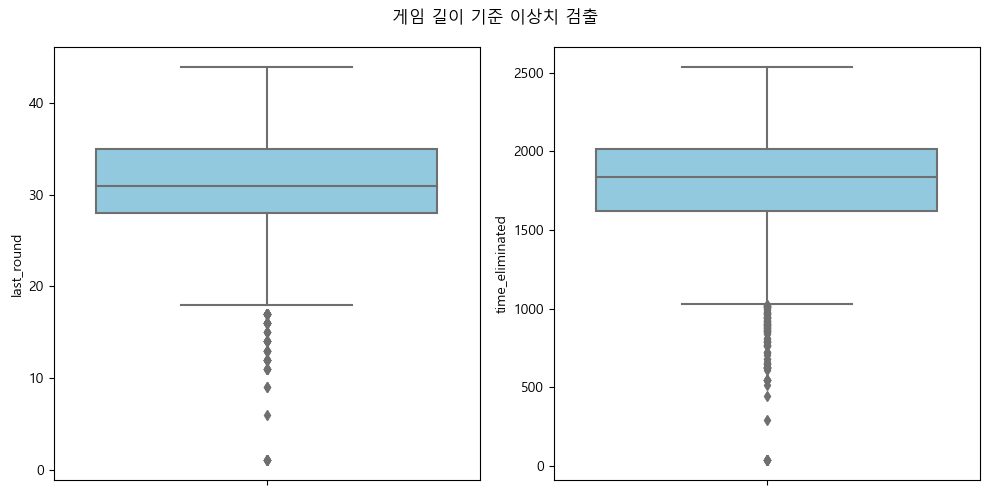

In [11]:
# 게임을 제대로 플레이 하지 않은 경기 확인
fig = plt.figure(figsize=(10, 5))
fig.suptitle("게임 길이 기준 이상치 검출")

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
sns.boxplot(match_player, y="last_round", color="skyblue", ax=ax1)
sns.boxplot(match_player, y="time_eliminated", color="skyblue", ax=ax2)

fig.tight_layout()
plt.show()

In [12]:
last_round_lfence, last_round_ufence = calculate_fence(match_player["last_round"])
time_eliminated_lfence, time_eliminated_ufence = calculate_fence(
    match_player["time_eliminated"]
)

outlier_condition = (
    (match_player["last_round"] > last_round_ufence)
    | (match_player["last_round"] < last_round_lfence)
    | (match_player["time_eliminated"] > time_eliminated_ufence)
    | (match_player["time_eliminated"] < time_eliminated_lfence)
)
outlier_match_player = match_player[outlier_condition]

# 유닛을 한마리도 뽑지 않은 플레이어가 존재하기 때문에 left 조인
outlier_match_player = outlier_match_player.merge(
    match_unit, how="left", left_on="match_player_id", right_on="match_player_id"
)

outlier_match_player = outlier_match_player.loc[
    :,
    [
        "match_player_id",
        "last_round",
        "level",
        "placement",
        "time_eliminated",
        "name",
        "tier",
    ],
]
outlier_match_player = outlier_match_player.groupby(by="match_player_id").agg(
    {
        "last_round": "first",
        "level": "first",
        "placement": "first",
        "time_eliminated": "first",
        "name": list,
        "tier": "mean",
    }
)

# t-헥스를 뽑은 플레이어 제외
outlier_player = outlier_match_player[
    outlier_match_player["name"].apply(
        lambda champ_list: True if "t-헥스" not in champ_list else False
    )
]
# 결과 반영
# outlier_player
# 이상치 플레이어 데이터 제거, 같이 플레이 한 플레이어들의 데이터는 유지
preprocessed_match_player = match_player[
    ~match_player["match_player_id"].isin(outlier_player.index)
]
preprocessed_match_unit = match_unit[
    ~match_unit["match_player_id"].isin(outlier_player.index)
]
preprocessed_match_trait = match_trait[
    ~match_trait["match_player_id"].isin(outlier_player.index)
]

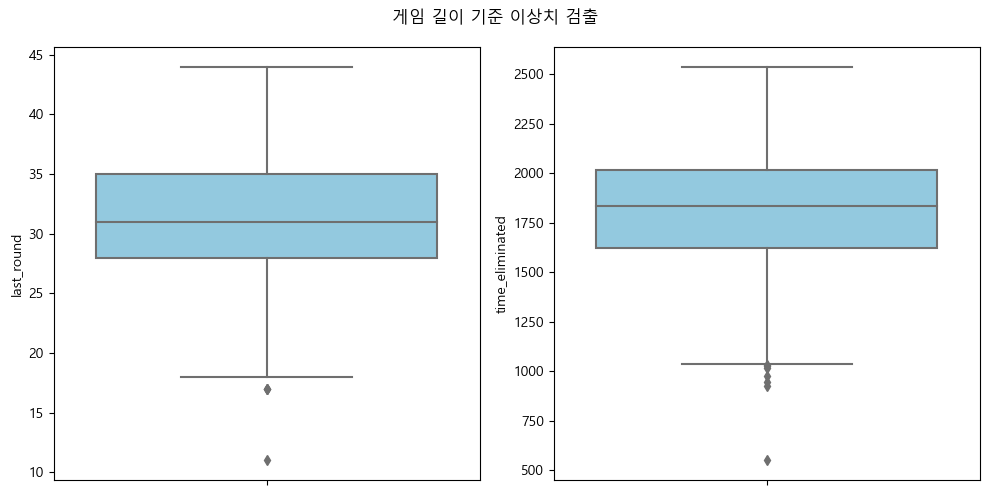

In [13]:
# 게임을 제대로 플레이 하지 않은 경기 확인
fig = plt.figure(figsize=(10, 5))
fig.suptitle("게임 길이 기준 이상치 검출")

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
sns.boxplot(preprocessed_match_player, y="last_round", color="skyblue", ax=ax1)
sns.boxplot(preprocessed_match_player, y="time_eliminated", color="skyblue", ax=ax2)

fig.tight_layout()
plt.show()

#### 유닛 비용의 합으로 이상치 검출


In [14]:
# preprocessed_match_unit = preprocessed_match_unit.loc[:,['match_player_id', 'name', 'rarity', 'tier']]

# 하이머딩거 포탑은 코스트가 없기 때문에 제외
preprocessed_match_unit = preprocessed_match_unit[
    preprocessed_match_unit["name"] != "최첨단 포탑"
]

# 특수 유닛 제외
preprocessed_match_unit = preprocessed_match_unit[
    preprocessed_match_unit["rarity"] <= 6
]

# 유닛 코스트를 계산하기 위한 전처리를 수행
rarity_to_cost = {0: 1, 1: 2, 2: 3, 4: 4, 6: 5}
preprocessed_match_unit["tier"] = preprocessed_match_unit["tier"].apply(
    lambda x: 3 if x >= 4 else x
)
preprocessed_match_unit["single_cost"] = preprocessed_match_unit.loc[:, "rarity"].apply(
    lambda x: rarity_to_cost[x]
)
preprocessed_match_unit["cost"] = preprocessed_match_unit.loc[:, "single_cost"] * (
    3 ** (preprocessed_match_unit.loc[:, "tier"] - 1)
)

# 데이터 가공
revised_match_unit = preprocessed_match_unit.groupby(by="match_player_id").agg(
    {"name": list, "cost": "sum", "tier": "mean"}
)
revised_match_unit["unit_count"] = revised_match_unit["name"].apply(lambda x: len(x))
revised_match_unit = revised_match_unit.merge(
    preprocessed_match_player.loc[
        :, ["match_player_id", "placement", "last_round", "level", "time_eliminated"]
    ],
    how="inner",
    left_on="match_player_id",
    right_on="match_player_id",
)
revised_match_unit.rename(
    columns={"cost": "cost_sum", "tier": "avg_tier"}, inplace=True
)
# revised_match_unit[['cost_sum', 'avg_tier', 'unit_count', 'placement']].head(24)

In [15]:
fig = px.box(
    revised_match_unit,
    y="cost_sum",
    title="유닛 비용의 합 기준 이상치 검출",
    color_discrete_sequence=["#58F"],
    template="plotly",
)
fig

In [16]:
outlier_player = revised_match_unit[revised_match_unit["cost_sum"] <= 18][
    "match_player_id"
]

# 이상치 플레이어 데이터 제거, 같이 플레이 한 플레이어들의 데이터는 유지
print(
    "제거 전:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)
preprocessed_match_player = preprocessed_match_player[
    ~preprocessed_match_player["match_player_id"].isin(outlier_player)
]
preprocessed_match_unit = preprocessed_match_unit[
    ~preprocessed_match_unit["match_player_id"].isin(outlier_player)
]
preprocessed_match_trait = preprocessed_match_trait[
    ~preprocessed_match_trait["match_player_id"].isin(outlier_player)
]
revised_match_unit = revised_match_unit[
    ~revised_match_unit["match_player_id"].isin(outlier_player)
]
print(
    "제거 후:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)

제거 전: (22876, 7) (184304, 10) (245399, 7) (22864, 9)
제거 후: (22840, 7) (184177, 10) (245202, 7) (22828, 9)


In [17]:
fig = px.box(
    revised_match_unit,
    y="cost_sum",
    title="유닛 비용의 합 기준 이상치 검출",
    color_discrete_sequence=["#58F"],
    template="plotly",
)
fig

#### 게임 도중 3성 유닛을 뽑기 위해 다른 유닛들을 판 데이터 제거


In [18]:
outlier_player = revised_match_unit[(revised_match_unit["unit_count"] < 5)][
    "match_player_id"
]
# 이상치 플레이어 데이터 제거, 같이 플레이 한 플레이어들의 데이터는 유지
print(
    "제거 전:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)
preprocessed_match_player = preprocessed_match_player[
    ~preprocessed_match_player["match_player_id"].isin(outlier_player)
]
preprocessed_match_unit = preprocessed_match_unit[
    ~preprocessed_match_unit["match_player_id"].isin(outlier_player)
]
preprocessed_match_trait = preprocessed_match_trait[
    ~preprocessed_match_trait["match_player_id"].isin(outlier_player)
]
revised_match_unit = revised_match_unit[
    ~revised_match_unit["match_player_id"].isin(outlier_player)
]
print(
    "제거 후:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)

제거 전: (22840, 7) (184177, 10) (245202, 7) (22828, 9)
제거 후: (22799, 7) (184035, 10) (245046, 7) (22787, 9)


### 각 서버 사용자 분포


#### 서버에 해당하는 국가 매칭


In [19]:
SERVER_INFO = {
    "BR1": ("Brazil",),
    "EUN1": ("Sweden", "Norway", "Estonia", "Latvia"),
    "EUW1": ("Spain", "United Kingdom", "Belgium"),
    "JP1": ("Japan",),
    "KR": ("Korea",),
    "LA1": ("Mexico", "Columbia", "Peru"),
    "LA2": ("Bolivia", "Uruguay", "Chile"),
    "NA1": ("United States", "Canada"),
    "OC1": ("Australia", "New Zealand"),
    "PH2": ("Philippines",),
    "RU": ("Russia",),
    "SG2": ("Singapore", "Malaysia", "Indonesia"),
    "TH2": ("Thailand",),
    "TR1": ("Turkey",),
    "TW2": ("Taiwan", "Hong Kong", "Macao"),
    "VN2": ("Vietnam",),
}

#### 지도 시각화할 데이터프레임을 생성


In [20]:
revised_match = match.copy()
revised_match['region'] = revised_match['match_id'].apply(lambda x: x.split("_")[0])
revised_match['continent'] = revised_match['region'].apply(lambda x: REGIONS_INFO[x])
revised_match['date'] = pd.to_datetime(revised_match['match_date'].apply(lambda x: x.split(" ")[0]))
revised_match['timestamp'] = revised_match['date'].apply(lambda x: x.timestamp())

In [21]:
player_count = revised_match.merge(match_player, how='inner', left_on = 'match_id', right_on = 'match_id')
player_count = player_count.drop_duplicates('puuid')
player_count = player_count.loc[:, ['continent', 'region', 'puuid']]
player_count = player_count.groupby(['continent', 'region']).count()
player_count = player_count.reset_index().sort_values("puuid", ascending=True)
player_count.rename(columns={"puuid": "count"}, inplace=True)

# 새로운 데이터를 담을 리스트 생성
new_data = []

# 각 지역의 국가 정보를 확장하여 리스트에 추가
for region, puuid in player_count.loc[:, ["region", "count"]].to_numpy():
    countries = SERVER_INFO.get(region, ())
    for country in countries:
        new_data.append((region, puuid, country))

# 새로운 데이터프레임 생성
country_player_count = pd.DataFrame(new_data, columns=["region", "count", "country"])

#### 서버별 사용자 수 시각화


In [22]:
fig = px.bar(
    player_count,
    x="region",
    y="count",
    text_auto=".3s",
    color="continent",
    title="서버별 사용자 수",
    color_discrete_sequence=px.colors.sequential.Turbo[1::1],
)
fig.update_traces(
    textfont_size=12, textangle=0, textposition="outside", cliponaxis=False
)
fig.show()

#### 서버별 사용자 분포 지도 시각화


In [23]:
# GeoJSON 파일 URL
url = "http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson"

# GeoJSON 파일을 GeoDataFrame으로 읽어옴
countries_geo = gpd.read_file(url)

In [24]:
# 기본 맵을 생성
map = folium.Map(location=(30, 10), zoom_start=2, tiles="cartodb positron")

bins = np.linspace(
    country_player_count["count"].min(), country_player_count["count"].max(), 16
)

# Choropleth Layer
choropleth_layer = folium.Choropleth(
    geo_data=countries_geo,
    data=country_player_count,
    columns=["country", "count"],
    key_on="feature.properties.name",
    fill_color="Blues",
    fill_opacity=0.7,
    line_opacity=0.3,
    nan_fill_color="white",
    legend_name="Player count",
    bins=bins,
)
choropleth_layer.add_to(map)

# 국가로 인덱스된 데이터프레임을 생성
player_data_indexed = country_player_count.set_index("country")

# 툴팁에 표시할 내용을 geojson.data에 추가
for s in choropleth_layer.geojson.data["features"]:
    region_name = s["properties"]["name"]
    if region_name not in player_data_indexed.index:
        count_value = ""
        server_value = ""
    else:
        count_value = str(
            player_data_indexed.loc[region_name, "count"]
        )  # Convert to str
        server_value = str(
            player_data_indexed.loc[region_name, "region"]
        )  # Convert to str
    s["properties"]["count"] = count_value
    s["properties"]["server"] = server_value

tooltip = folium.GeoJsonTooltip(fields=["name", "server", "count"], labels=True)
choropleth_layer.geojson.add_child(tooltip)

folium.TileLayer("openstreetmap").add_to(map)
folium.LayerControl().add_to(map)
map

#### 지역별 Top10 플레이어의 게임 시간 분포

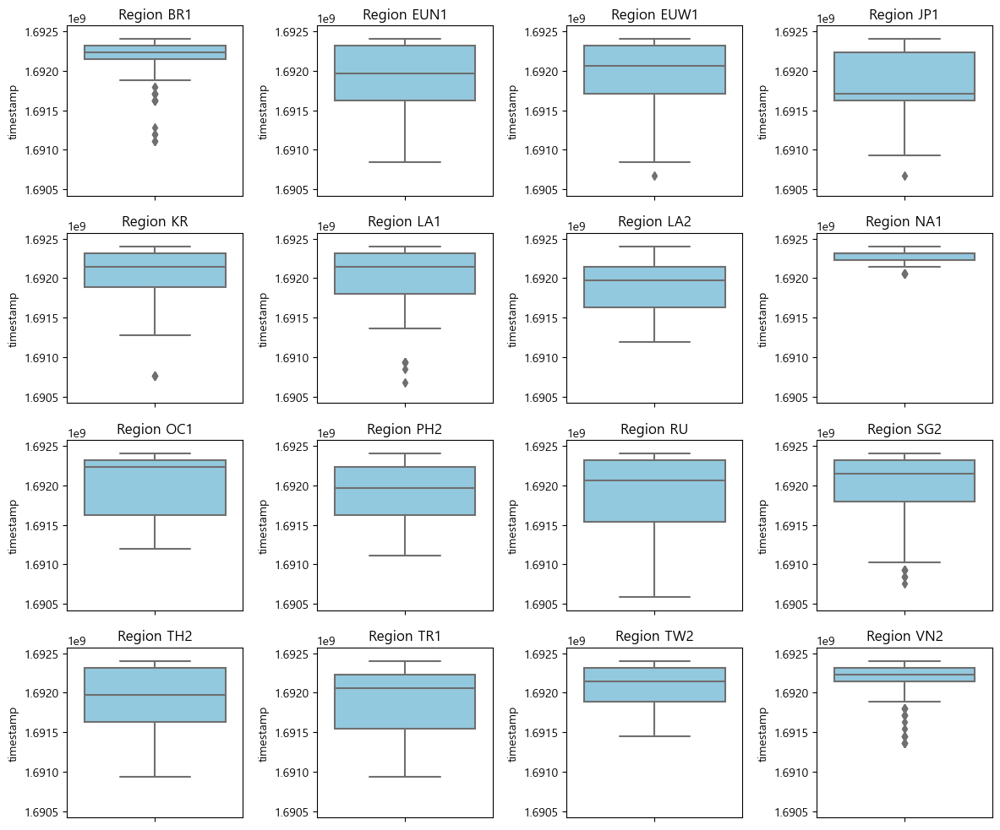

In [25]:
# 서브플롯 설정
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 10))
sns.set_theme(style='whitegrid', font=font_family)

# 각 region 별로 히스토그램 그리기
for (region, ax) in zip(revised_match['region'].unique(), axes.flatten()):
    sns.boxplot(data=revised_match[revised_match['region'] == region], y='timestamp', color='skyblue', ax=ax)
    ax.set_ylim(revised_match['timestamp'].min()*0.9999, revised_match['timestamp'].max()*1.0001)
    ax.set_title(f'Region {region}')

# 레이아웃 조정
plt.tight_layout()
plt.show()

In [26]:
top10_player = player_stat.loc[:, ['puuid']]
top10_player_match = top10_player.merge(match_player, how='inner', left_on='puuid', right_on = 'puuid')
# top10_player_match = top10_player_match.drop_duplicates('match_id')
top10_player_match = top10_player_match.merge(player, how='inner', left_on='puuid', right_on='puuid')
top10_player_match = top10_player_match.merge(revised_match, how='inner', left_on='match_id', right_on='match_id')

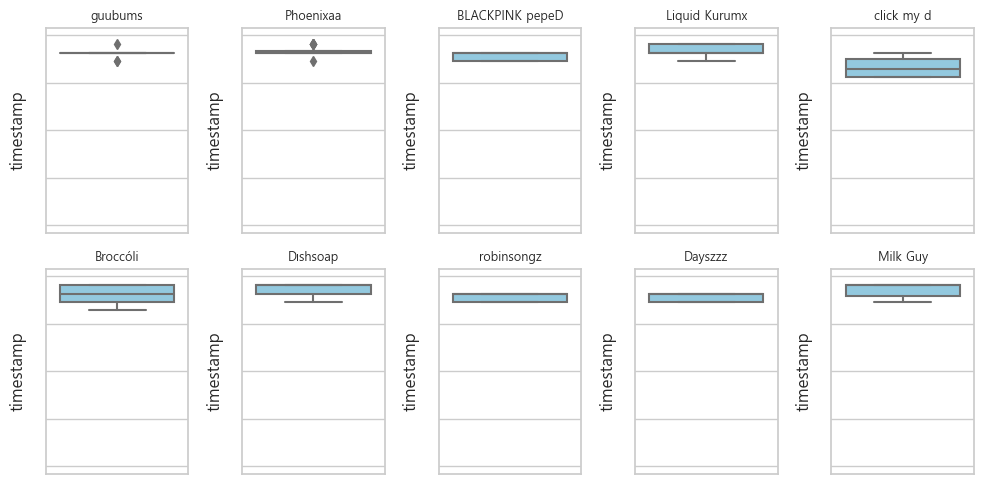

In [27]:
top10_player_match_reg = top10_player_match[top10_player_match['region_x']=='NA1']
# 서브플롯 설정
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10, 5))
sns.set_theme(style='whitegrid', font=font_family)

# 각 region 별로 히스토그램 그리기
for (name, ax) in zip(top10_player_match_reg['name'].unique(), axes.flatten()):
    sns.boxplot(data=top10_player_match_reg[top10_player_match_reg['name'] == name], y='timestamp', color='skyblue', ax=ax)
    ax.set_ylim(top10_player_match['timestamp'].min()*0.9999, top10_player_match['timestamp'].max()*1.0001)
    ax.set_title(f'{name}', fontsize=9)
    ax.set_yticklabels("")

# 레이아웃 조정
plt.tight_layout()
plt.show()

### 연관 규칙 분석


#### 특성 별 연관규칙 분석


In [29]:
# 전체 티어가 1인 특성과 현제 티어가 0인 특성 제외
revised_match_trait = preprocessed_match_trait[preprocessed_match_trait["tier_total"] > 1]
revised_match_trait = revised_match_trait[revised_match_trait["tier_current"] > 0]
revised_match_trait = revised_match_trait.groupby("match_player_id")[["name"]].agg(list)

In [30]:
# 버전 정보를 얻기 위해서 병합 작업을 수행
merged_match_trait = match.merge(
    preprocessed_match_player, how="inner", left_on="match_id", right_on="match_id"
)
merged_match_trait = merged_match_trait.merge(
    revised_match_trait,
    how="inner",
    left_on="match_player_id",
    right_on="match_player_id",
)

# 가장 최신 버전에 해당하는 기록만 남김
latest_match_trait = merged_match_trait[
    (merged_match_trait["version_major"] == VERSION_MAJOR)
    & (merged_match_trait["version_minor"] == VERSION_MINOR)
    & (merged_match_trait["version_patch"] == VERSION_PATCH)
]
latest_match_trait = merged_match_trait.loc[:, ["match_player_id", "name"]]

# 전처리 후 지지도 계산
te = TransactionEncoder()
te_result = te.fit_transform(latest_match_trait["name"])
td_df = pd.DataFrame(te_result, columns=te.columns_)
freq_items = apriori(td_df, min_support=0.05, use_colnames=True)

# freq_items.sort_values('support', ascending=False).head(15)

# 연관규칙 분석
rules = association_rules(freq_items, metric="confidence", min_threshold=0.8)
rules["antecedents_str"] = rules["antecedents"].apply(lambda x: ",".join(list(x)))
rules["consequents_str"] = rules["consequents"].apply(lambda x: ",".join(list(x)))
# rules.head()

In [31]:
# 점 그래프 생성
fig = px.scatter(
    rules,
    x="support",
    y="confidence",
    size="lift",
    color="lift",
    custom_data=["antecedents_str", "consequents_str", "lift"],
    color_continuous_scale=px.colors.sequential.Jet,
    title="특성 조합 연관규칙",
    labels={"support": "지지도", "confidence": "신뢰도", "lift": "향상도"},
)
# 툴팁 추가
fig.update_traces(
    hovertemplate="<br>".join(
        [
            "<b>조건</b>: %{customdata[0]}",
            "<b>결과</b>: %{customdata[1]}<br>",
            "<b>지지도</b>: %{x:.3%}",
            "<b>신뢰도</b>: %{y:.3%}",
            "<b>향상도</b>: %{customdata[2]:.4f}",
        ]
    )
)
# 그래프 출력 사이즈 조절
fig.update_layout(
    width=1100,  # 너비
    height=600,  # 높이
    hovermode='closest'  # 가장 가까운 데이터 포인트의 툴팁 표시
)
# 그래프 표시
fig.show()

#### 각 특성의 신뢰도 히트맵 표현


In [32]:
# 신뢰도 기준 0으로 설정 후 계산
rules_conf0 = association_rules(freq_items, metric="confidence", min_threshold=0)
rules_conf0["antecedents_str"] = rules_conf0["antecedents"].apply(
    lambda x: ",".join(list(x))
)
rules_conf0["consequents_str"] = rules_conf0["consequents"].apply(
    lambda x: ",".join(list(x))
)

# 조건절과 결과절의 개수가 1인 것만 추출
single_condition = (rules_conf0["antecedents"].apply(len) == 1) & (
    rules_conf0["consequents"].apply(len) == 1
)
rules_single = rules_conf0[single_condition].loc[
    :, ["antecedents_str", "consequents_str", "confidence"]
]

# 히트맵에 사용될 특성
target_trait = sorted(rules_single["antecedents_str"].unique())

# 히트맵에 사용할 데이터 프레임 생성
revised_rules_df = pd.DataFrame(index=target_trait)

In [33]:
# 대상 특성 순회
for col in target_trait:
    # 열 설정을 위한 빈 리스트 생성 : row -> col의 신뢰도를 저장합니다.
    col_conf = []
    for row in target_trait:
        confidence = rules_single[
            (rules_single["antecedents_str"] == row)
            & (rules_single["consequents_str"] == col)
        ]["confidence"]

        # confidence값이 없을 경우는 0으로 설정
        if confidence.shape[0] > 0:
            col_conf.append(confidence.values[0])
        else:
            col_conf.append(0)
    revised_rules_df[col] = col_conf

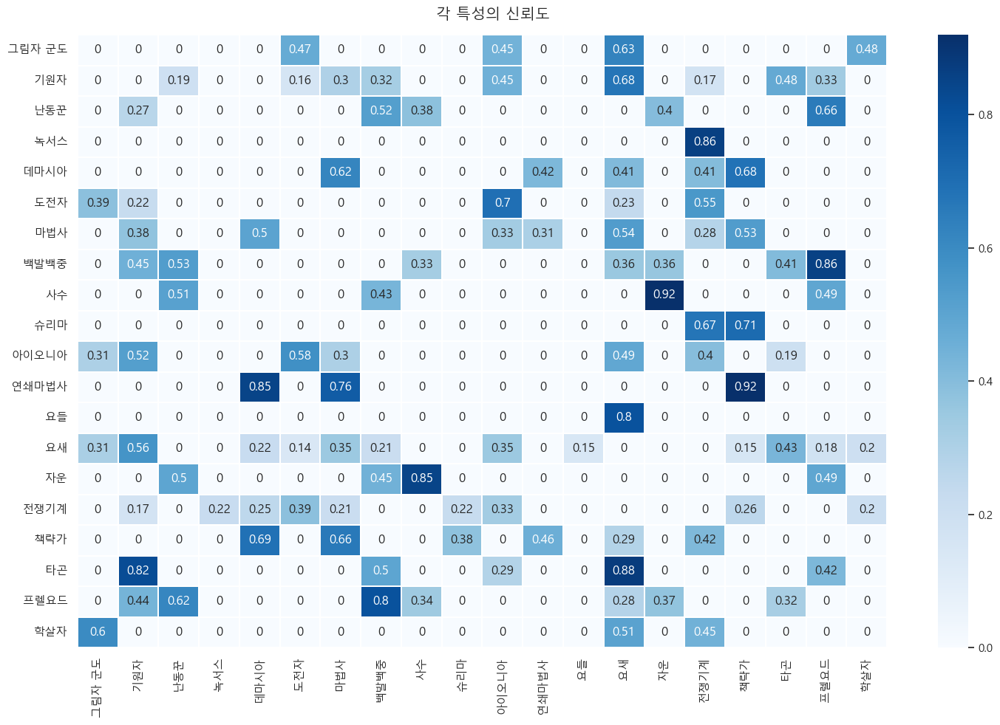

In [34]:
fig = plt.figure(figsize=(15, 10))
fig.suptitle("각 특성의 신뢰도", x=0.45)
ax = fig.add_subplot(1, 1, 1)
sns.heatmap(
    revised_rules_df,
    annot=True,
    ax=ax,
    cmap=sns.color_palette("Blues", as_cmap=True),
    linewidths=0.01,
)

plt.tight_layout()
plt.show()

### 상관관계 분석


#### 유닛 코스트의 합, 유닛 개수의 합, 유닛 단계의 평균과 순위와의 상관관계 분석


In [35]:
# 선택한 열들에 대한 상관 분석 수행
correlation_matrix = revised_match_unit[
    ["cost_sum", "avg_tier", "unit_count", "placement"]
].corr()

#### 상관관계 히트맵

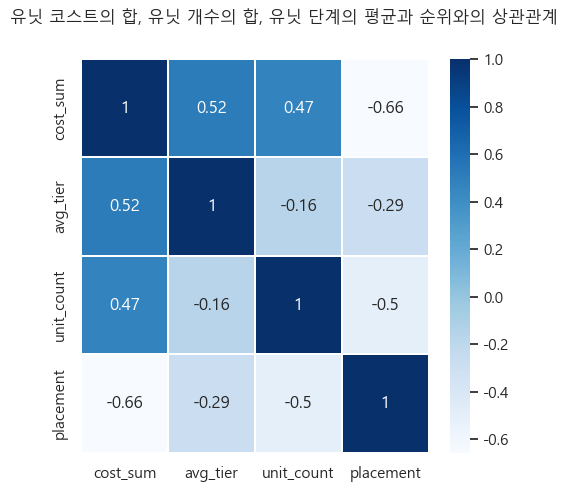

In [36]:
fig = plt.figure(figsize=(5, 5))
fig.suptitle("유닛 코스트의 합, 유닛 개수의 합, 유닛 단계의 평균과 순위와의 상관관계", x=0.5, size=12)
ax = fig.add_subplot(1, 1, 1)
sns.heatmap(
    correlation_matrix,
    annot=True,
    ax=ax,
    cmap=sns.color_palette("Blues", as_cmap=True),
    linewidths=0.01,
)

plt.tight_layout()
plt.show()

#### 각 항목의 히스토그램과 선 그래프

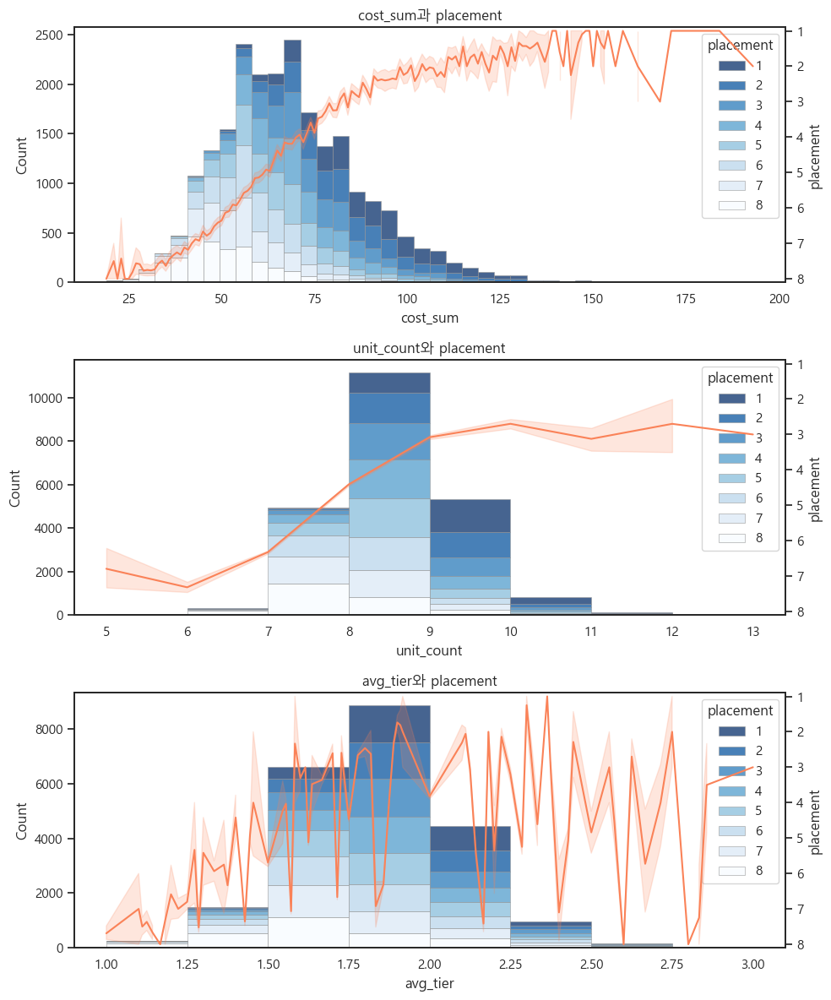

In [37]:
sns.set_theme(style='white', font=font_family, color_codes='deep')

fig = plt.figure(figsize=(10, 12))
# cost_sum과 placement
ax1_1 = fig.add_subplot(3, 1, 1)
ax1_2 = ax1_1.twinx()
data = revised_match_unit.sort_values(["cost_sum", "placement"])
sns.histplot(
    revised_match_unit,
    x="cost_sum",
    hue="placement",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    bins=40,
    ax=ax1_1,
)
sns.lineplot(data=data, x="cost_sum", y="placement", color='#FA8258', ax=ax1_2)
ax1_1.set_title("cost_sum과 placement")
ax1_2.set_ylim(data["placement"].max() + 0.1, data["placement"].min() - 0.1)

# unit_count와 placement
ax2_1 = fig.add_subplot(3, 1, 2)
ax2_2 = ax2_1.twinx()
data = revised_match_unit.sort_values(["unit_count", "placement"])
sns.histplot(
    revised_match_unit,
    x="unit_count",
    hue="placement",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    bins=8,
    ax=ax2_1,
)

sns.lineplot(data=data, x="unit_count", y="placement", color='#FA8258', ax=ax2_2)
ax2_1.set_title("unit_count와 placement")
ax2_2.set_ylim(data["placement"].max() + 0.1, data["placement"].min() - 0.1)

# avg_tier와 placement
ax3_1 = fig.add_subplot(3, 1, 3)
ax3_2 = ax3_1.twinx()
data = revised_match_unit.sort_values(["avg_tier", "placement"])
sns.histplot(
    revised_match_unit,
    x="avg_tier",
    hue="placement",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    bins=8,
    ax=ax3_1,
)

sns.lineplot(data=data, x="avg_tier", y="placement", color='#FA8258', ax=ax3_2)
ax3_1.set_title("avg_tier와 placement")
ax3_2.set_ylim(data["placement"].max() + 0.1, data["placement"].min() - 0.1)

plt.tight_layout()
plt.show()

### 통계 분석

#### 각 유닛 조합의 등장 비율과 평균순위

In [38]:
# 가장 최신 버전의 match_player_id 리스트를 추출
latest_match_player = match.merge(preprocessed_match_player, how='inner', left_on='match_id', right_on='match_id')
latest_match_player = latest_match_player[
    (latest_match_player["version_major"] == VERSION_MAJOR)
    & (latest_match_player["version_minor"] == VERSION_MINOR)
    & (latest_match_player["version_patch"] == VERSION_PATCH)
]
latest_match_player_id = latest_match_player['match_player_id']

# 최신 버전에 사용된 유닛만 추출
latest_match_unit = revised_match_unit.loc[revised_match_unit['match_player_id'].isin(latest_match_player_id)]
# 슬라이싱
latest_match_unit = latest_match_unit.loc[:, ['name', 'placement']]

In [39]:
# df의 list_str 컬럼의 모든 조합에 대하여 numeric_str 컬럼의
# frequency와 frequency percentage, average, combination length를 계산하여 result_df를 반환합니다.
def calculate_combination_statistic(df, list_str, numeric_str):
    # 각 조합의 평균 순위와 빈도수를 저장할 defaultdict 초기화
    combo_data = defaultdict(lambda: {numeric_str: [], "count": 0})
    
    # 데이터프레임 순회하며 조합의 평균 순위와 빈도수 계산
    for index, row in df.iterrows():
        items = row[list_str]
        numeric = row[numeric_str]
    
        # 플레이어가 사용한 조합 추가
        combo = tuple(sorted(items))
        combo_data[combo][numeric_str].append(numeric)
        combo_data[combo]["count"] += 1
    
        # 조합의 부분집합들 추가
        for r in range(1, len(items)):
            for subset in combinations(items, r):
                subset_combo = tuple(sorted(subset))
                combo_data[subset_combo][numeric_str].append(numeric)
                combo_data[subset_combo]["count"] += 1
    
    # 각 조합 및 부분집합들의 평균 순위와 빈도수를 데이터프레임으로 변환
    result_data = []
    for combo, data in combo_data.items():
        avg_rank = sum(data[numeric_str]) / data["count"]
        percentage = data["count"] / len(df)
        result_data.append(
            {"combination": combo, "avg_rank": avg_rank, "frequency": data["count"],
             "percentage": percentage, "length" : len(combo)}
        )
    
    result_df = pd.DataFrame(result_data)
    return result_df

In [40]:
# 모든 조합의 통계를 계산
unit_combination_stat = calculate_combination_statistic(latest_match_unit, 'name', 'placement')
# 조합을 유닛의 비용 기준으로 정렬
# 유닛의 비용 dict를 생성
unit_cost = preprocessed_match_unit.groupby(by='name').first().reset_index().loc[:,['name', 'single_cost']].\
                    sort_values(['single_cost', 'name'])
unit_cost = {row['name']:row['single_cost'] for i, row in unit_cost.iterrows()}

# 튜플의 내용을 유닛의 코스트로 정렬한 후 str으로 변환
sorted_combs = unit_combination_stat['combination'].apply(lambda champs: ", ".join(sorted(champs, key=lambda champ: unit_cost[champ])))
unit_combination_stat.loc[:,['combination']] = sorted_combs

In [41]:
# 비율이 기준 이하인 조합은 제외
criteria = 0.001
limited_unit_comb_stat = unit_combination_stat.loc[unit_combination_stat['percentage'] > criteria]
dot5_combination_stat = unit_combination_stat.loc[unit_combination_stat['percentage'] > 0.005]
per1_combination_stat = unit_combination_stat.loc[unit_combination_stat['percentage'] > 0.01]

In [42]:
# 점 그래프 생성
fig = px.scatter(
    dot5_combination_stat,
    x="percentage",
    y="avg_rank",
    size="percentage",
    color='length',
    hover_name="combination",
    title="각 조합의 등장 비율과 평균 순위",
    labels={
        "percentage": "비율",
        "avg_rank": "평균 순위",
        "length": "길이"
    },
    log_x=False,
    color_continuous_scale=px.colors.sequential.Jet,
    custom_data=["frequency", "percentage", "length"],
)

# 툴팁 추가
fig.update_traces(
    hovertemplate="<br>".join(
        [
            "<b>조합</b>: %{hovertext}<br>",
            "<b>평균 순위</b>: %{y:.4f}",
            "<b>빈도</b>: %{customdata[0]}",
            "<b>비율</b>: %{customdata[1]:.3%}",
            "<b>길이</b>: %{customdata[2]}"
        ]
    )
)
# y축 반전
fig.update_yaxes(autorange="reversed")

# 그래프 출력 사이즈 조절
fig.update_layout(
    width=1100,  # 너비
    height=800,  # 높이
    hovermode='closest'  # 가장 가까운 데이터 포인트의 툴팁 표시
)
# 그래프 표시
fig.show()

#### 전체 조합에 대한 평균순위 히스토그램

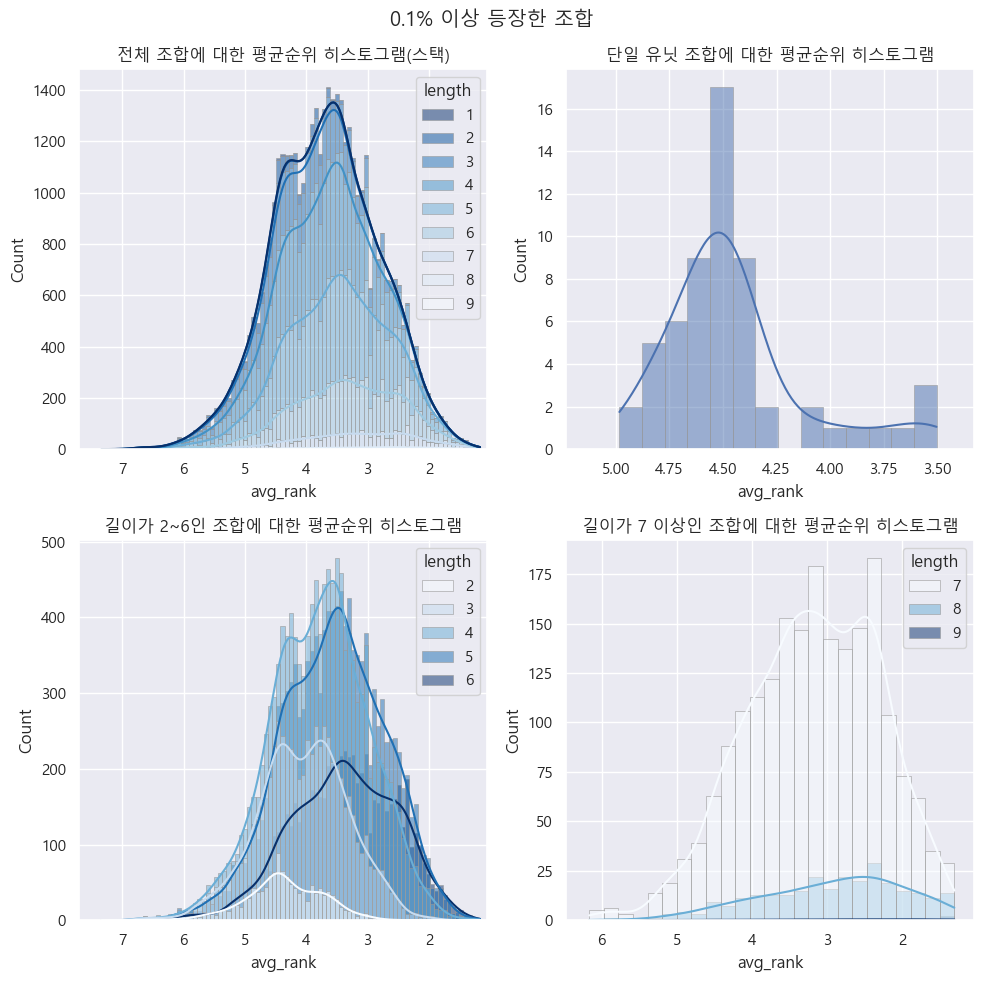

In [43]:
sns.set_theme(style='darkgrid', font=font_family, color_codes='deep')

fig = plt.figure(figsize=(10,10))
fig.suptitle(f"{criteria*100}% 이상 등장한 조합")
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)
ax3 = fig.add_subplot(2,2,3)
ax4 = fig.add_subplot(2,2,4)

# 그래프 1
data = limited_unit_comb_stat

ax = sns.histplot(
    data,
    x="avg_rank",
    hue="length",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax1
)

ax.set_title("전체 조합에 대한 평균순위 히스토그램(스택)")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.9)

# 그래프 2
data = limited_unit_comb_stat.loc[(limited_unit_comb_stat['length']==1)]

ax = sns.histplot(
    data,
    x="avg_rank",
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax2
)

ax.set_title("단일 유닛 조합에 대한 평균순위 히스토그램")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.95)

# 그래프 3
data = limited_unit_comb_stat.loc[(limited_unit_comb_stat['length']<=6) & (limited_unit_comb_stat['length']>1)]

ax = sns.histplot(
    data,
    x="avg_rank",
    hue="length",
    # multiple="stack",
    palette=sns.color_palette("Blues", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax3
)

ax.set_title("길이가 2~6인 조합에 대한 평균순위 히스토그램")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.9)

# 그래프 4
data = limited_unit_comb_stat.loc[(limited_unit_comb_stat['length']>6)]

sns.set_theme(style='darkgrid', font=font_family, color_codes='deep')

ax = sns.histplot(
    data,
    x="avg_rank",
    hue="length",
    # multiple="stack",
    palette=sns.color_palette("Blues", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax4
)

ax.set_title("길이가 7 이상인 조합에 대한 평균순위 히스토그램")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.8)

plt.tight_layout()
plt.show()

* 조합한 데이터의 평균 순위 분포를 확인하고 게임 밸런스를 파악하기 위해서 히스토그램을 그렸습니다.
* 전체 조합에 대한 평균순위 히스토그램에서는 가장 많이 등장한 평균 순위는 1등에서 8등의 평균인 4.5등이 나올거라 생각했지만 그렇지 않았습니다.
* 이유는 아까 살펴봤듯이, 등수가 높아질수록 평균적으로 유닛의 개수가 증가합니다. 따라서 조합의 길이가 증가할수록 상위 등수를 차지한 플레이어의 조합의 빈도가 증가하기 때문에 각 길이별 조합의 가장 많이 등장한 평균 순위는 우측으로 이동합니다.
* 그래서 길이가 2 이상부터는 게임 밸런스를 파악하는데 크게 신뢰할 수 없을 것이라 생각되고 길이가 1인 단일 유닛의 분포를 확인하면 게임밸런스를 어느정도 파악 가능할 것으로 봅니다.
  
* 그럼 이제 단일 유닛 조합에 대한 평균순위 히스토그램을 다시 보겠습니다.
* 순위의 평균인 4.5 근처의 유닛들은 밸런스가 잘 잡힌 유닛이라 파악할 수 있습니다.
* 순위 평균 4.5 이하의 유닛들은 선택 시 게임의 순위가 낮아질 가능성이 높은 유닛들로써 추후 버프 대상으로 고려할 수 있습니다.
* 반대로, 순위 평균 4.5 이상의 유닛들은 선택 시 게임의 순위가 높아질 가능성이 높은 유닛들로써 추후 너프 대상으로 고려할 수 있습니다.
* 전체적으로 4.5위 근처에 많은 유닛들이 배치되어 게임 밸런스적으로는 괜찮다고 생각됩니다.

#### 단일 유닛의 사용 빈도, 사용 비율, 평균 순위 히트맵

In [44]:
single_unit_stat = per1_combination_stat[per1_combination_stat['length']==1]
single_unit_stat = single_unit_stat.loc[:, ['combination', 'avg_rank', 'frequency', 'percentage']]
single_unit_stat = single_unit_stat.set_index('combination')
single_unit_stat.sort_values(by='avg_rank', inplace=True)
single_unit_avg_rank = single_unit_stat.loc[:,['avg_rank']]

dropped_single_unit_stat = single_unit_stat.drop('avg_rank', inplace=False, axis=1)
dropped_single_unit_stat = dropped_single_unit_stat.sort_values(by='frequency', ascending=False)

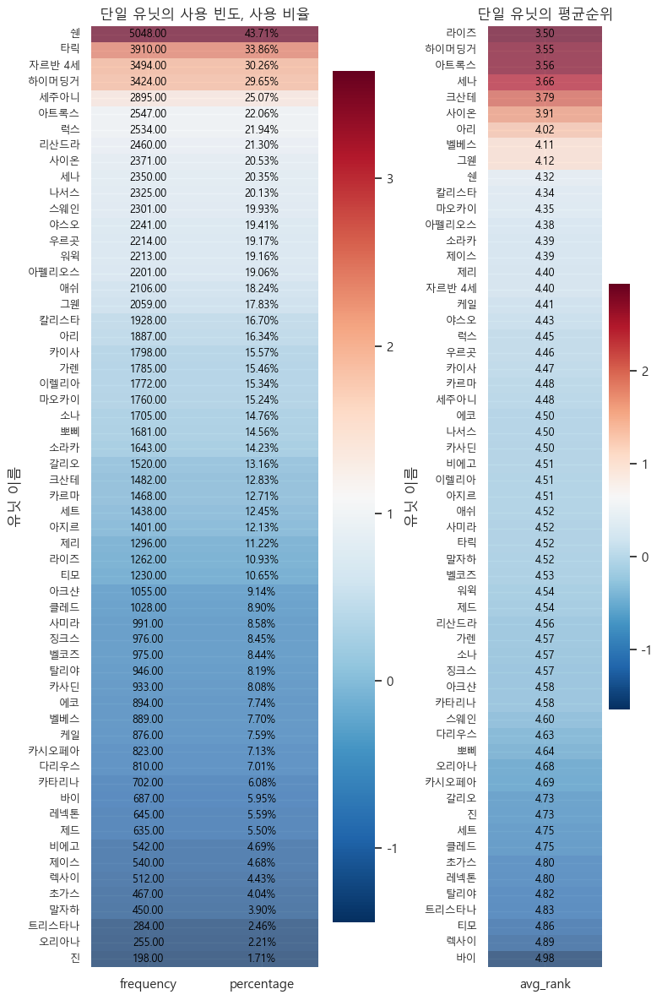

In [45]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(dropped_single_unit_stat)
scaled_df = pd.DataFrame(scaled_data, columns=dropped_single_unit_stat.columns, index=dropped_single_unit_stat.index)

fig = plt.figure(figsize=(8, 12))

# GridSpec 설정
gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1])  # 1행 2열, 첫 번째 그래프 폭을 두 번째 그래프 폭의 2배로 지정

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

heatmap = sns.heatmap(scaled_df, annot=False, cmap="RdBu_r", fmt=".2f", ax=ax1)

# Adjust the alpha value for the colormap
heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)

# 주석 추가로 원래의 값을 나타냅니다.
for i in range(len(dropped_single_unit_stat.index)):
    for j in range(len(dropped_single_unit_stat.columns)):
        if j==1:
            ax1.text(j + 0.5, i + 0.5, f"{dropped_single_unit_stat.iloc[i, j]*100:.2f}%", ha="center", va="center", color="Black", fontsize=9)
            continue
        ax1.text(j + 0.5, i + 0.5, f"{dropped_single_unit_stat.iloc[i, j]:.2f}", ha="center", va="center", color="Black", fontsize=9)
            
ax1.set_title("단일 유닛의 사용 빈도, 사용 비율")
ax1.set_ylabel("유닛 이름")
ax1.yaxis.set_tick_params(labelsize=9)

# graph2
scaled_data = scaler.fit_transform(single_unit_avg_rank)
scaled_df = pd.DataFrame(scaled_data, columns=single_unit_avg_rank.columns, index=single_unit_avg_rank.index)

# 순위 데이터의 기준과 다른 데이터의 기준을 맞추기
scaled_df['avg_rank'] =scaled_df['avg_rank'].apply(lambda x: -x)

heatmap = sns.heatmap(scaled_df, annot=False, cmap="RdBu_r", fmt=".2f", ax=ax2)

# Adjust the alpha value for the colormap
heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)

# 주석 추가로 원래의 값을 나타냅니다.
for i in range(len(single_unit_avg_rank.index)):
    for j in range(len(single_unit_avg_rank.columns)):
        ax2.text(j + 0.5, i + 0.5, f"{single_unit_avg_rank.iloc[i, j]:.2f}", ha="center", va="center", color="Black", fontsize=9)
            
ax2.set_title("단일 유닛의 평균순위")
ax2.set_ylabel("유닛 이름")
ax2.yaxis.set_tick_params(labelsize=9)

plt.tight_layout()
# plt.savefig("graph.png")  # 파일 경로와 이름 지정
plt.show()

#### 단일 유닛의 사용 비율, 평균 순위 히트맵(Top10, Bottom10)

In [46]:
def plot_avgrank_percentage_heatmap(rank_df, percent_df, fig_size=(6,6), item_size=10):
    # 위에서 10개와 아래에서 10개의 데이터 선택
    selected_data = pd.concat([rank_df.head(item_size), rank_df.tail(item_size)])
    
    fig = plt.figure(figsize=fig_size)
    
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    
    # graph1
    heatmap = sns.heatmap(selected_data,  annot=True, cmap="RdBu", fmt=".2f", ax=ax1, annot_kws={"size": 9})
    
    # Adjust the alpha value for the colormap
    heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)
                
    ax1.yaxis.set_tick_params(labelsize=9)
    
    # graph2
    selected_data = pd.concat([percent_df.head(item_size), percent_df.tail(item_size)])
    heatmap = sns.heatmap(selected_data, annot=True, cmap="RdBu_r", fmt=".2%", ax=ax2, annot_kws={"size": 9})
    
    # Adjust the alpha value for the colormap
    heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)
                
    ax2.yaxis.set_tick_params(labelsize=9)
    
    plt.tight_layout(pad=2)
    # plt.savefig("graph.png")  # 파일 경로와 이름 지정
    plt.show()

In [47]:
def get_sorted_column_df(df, index, columns, ascending=True):
    result_df = df.loc[:, [index, *columns]]
    result_df = result_df.set_index(index)
    result_df.sort_values(by=columns, inplace=True, ascending=ascending)
    return result_df

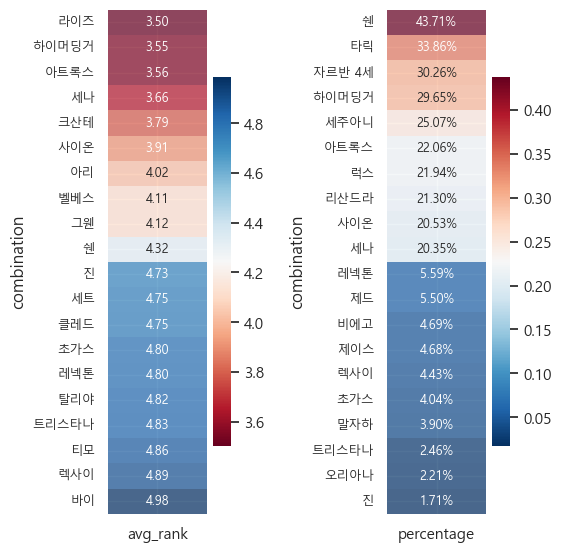

In [48]:
unit_stat_len1 = per1_combination_stat[per1_combination_stat['length']==1]

unit_stat_len1_avgrank = get_sorted_column_df(unit_stat_len1, 'combination', ['avg_rank'])
unit_stat_len1_percent = get_sorted_column_df(unit_stat_len1, 'combination', ['percentage'], False)
plot_avgrank_percentage_heatmap(unit_stat_len1_avgrank, unit_stat_len1_percent, fig_size=(6,6))

#### 길이 2 이상인 유닛 조합의 사용 비율, 평균 순위 히트맵(Top10, Bottom10)

In [49]:
def plot_avgrank_percentage_heatmap_col2(rank_df, percent_df, fig_size=(6,6), title="", shape=(1,2), item_size=10, font_size=9, label_size=9):
    selected_data = pd.concat([rank_df.head(item_size), rank_df.tail(item_size)])
    
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(selected_data)
    scaled_df = pd.DataFrame(scaled_data, columns=selected_data.columns, index=selected_data.index)
    
    # 순위 데이터의 기준과 다른 데이터의 기준을 맞추기
    scaled_df['avg_rank'] =scaled_df['avg_rank'].apply(lambda x: -x)
    fig = plt.figure(figsize=fig_size)
    fig.suptitle(title)
    
    ax1 = fig.add_subplot(*shape,1)
    ax2 = fig.add_subplot(*shape,2)
    
    heatmap = sns.heatmap(scaled_df, annot=False, cmap="RdBu_r", fmt=".2f", ax=ax1)
    
    # Adjust the alpha value for the colormap
    heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)
    
    # 주석 추가로 원래의 값을 나타냅니다.
    for i in range(len(selected_data.index)):
        for j in range(len(selected_data.columns)):
            if j==1:
                ax1.text(j + 0.5, i + 0.5, f"{selected_data.iloc[i, j]*100:.2f}%", ha="center", va="center", color="Black", fontsize=font_size)
                continue
            ax1.text(j + 0.5, i + 0.5, f"{selected_data.iloc[i, j]:.2f}", ha="center", va="center", color="Black", fontsize=font_size)
                
    ax1.yaxis.set_tick_params(labelsize=label_size)
    
    # graph2
    selected_data = pd.concat([percent_df.head(item_size), percent_df.tail(item_size)])
    
    scaled_data = scaler.fit_transform(selected_data)
    scaled_df = pd.DataFrame(scaled_data, columns=selected_data.columns, index=selected_data.index)
    
    # 순위 데이터의 기준과 다른 데이터의 기준을 맞추기
    scaled_df['avg_rank'] =scaled_df['avg_rank'].apply(lambda x: -x)
    
    heatmap = sns.heatmap(scaled_df, annot=False, cmap="RdBu_r", fmt=".2f", ax=ax2)
    
    # Adjust the alpha value for the colormap
    heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)
    
    # 주석 추가로 원래의 값을 나타냅니다.
    for i in range(len(selected_data.index)):
        for j in range(len(selected_data.columns)):
            if j==0:
                ax2.text(j + 0.5, i + 0.5, f"{selected_data.iloc[i, j]*100:.2f}%", ha="center", va="center", color="Black", fontsize=font_size)
                continue
            ax2.text(j + 0.5, i + 0.5, f"{selected_data.iloc[i, j]:.2f}", ha="center", va="center", color="Black", fontsize=font_size)
                
    ax2.yaxis.set_tick_params(labelsize=label_size)
    
    plt.tight_layout()
    # plt.savefig("graph.png")  # 파일 경로와 이름 지정
    plt.show()

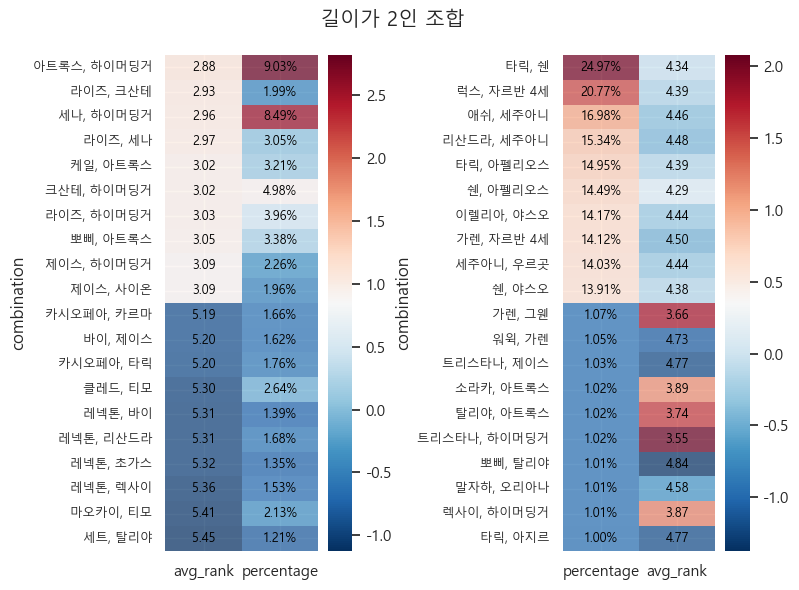

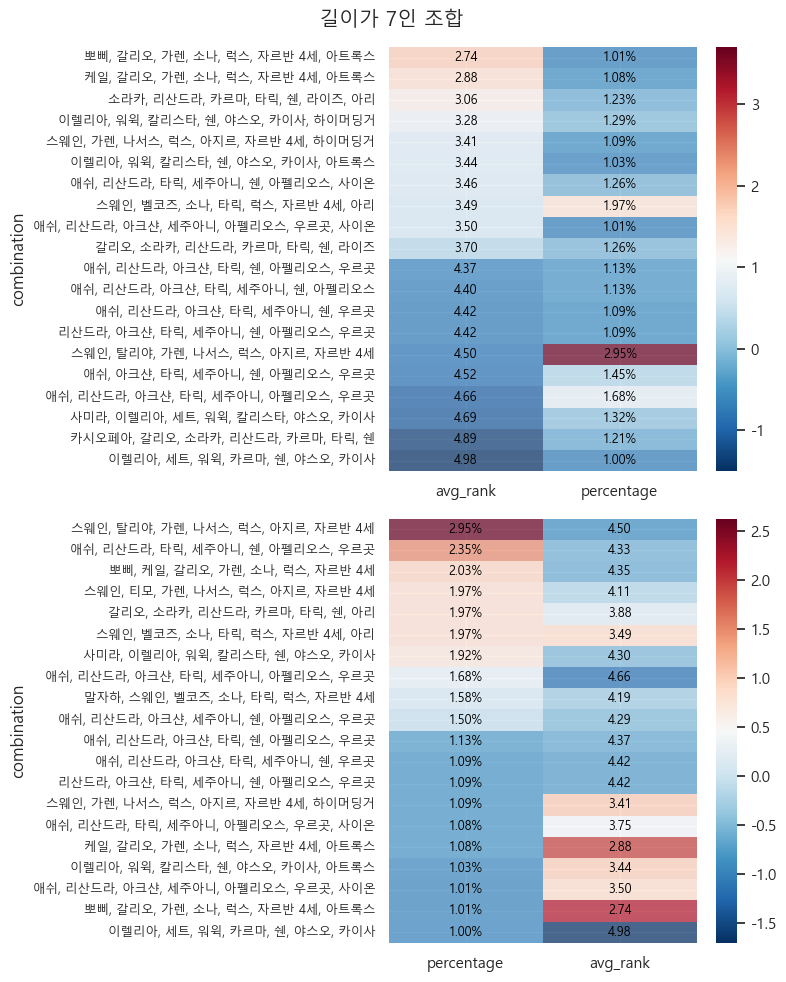

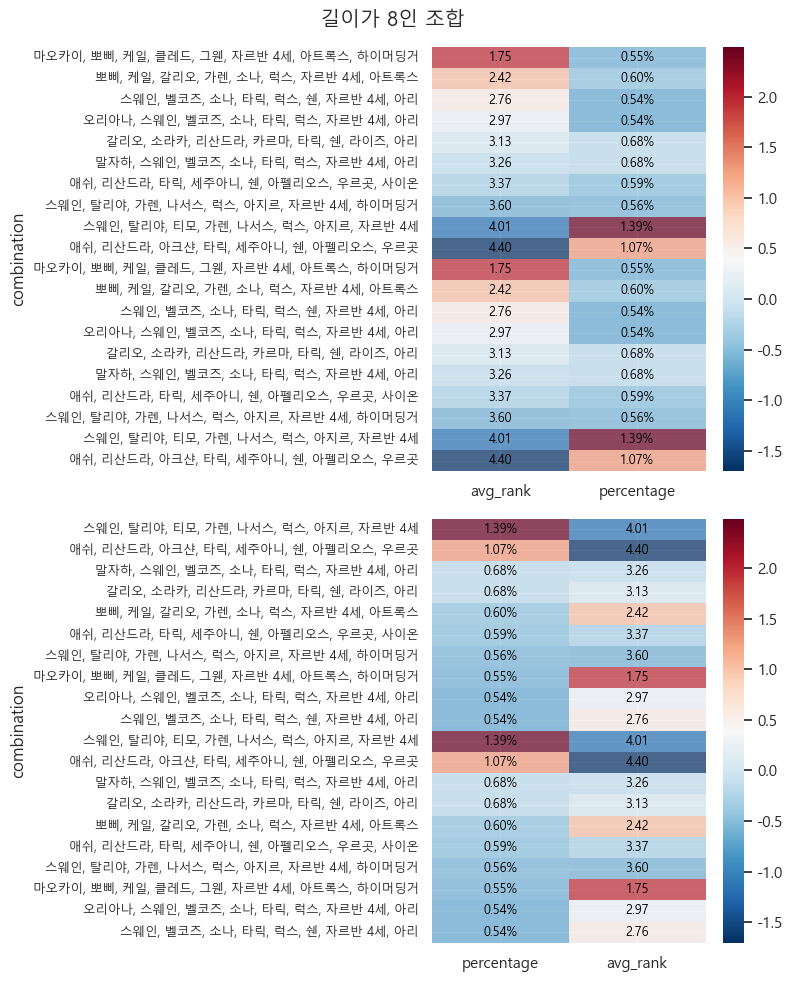

In [50]:
sns.set_theme(style='darkgrid', font=font_family)
unit_stat_len2 = per1_combination_stat[per1_combination_stat['length']==2]

unit_stat_len2_avgrank = get_sorted_column_df(unit_stat_len2, 'combination', ['avg_rank', 'percentage'])
unit_stat_len2_percent = get_sorted_column_df(unit_stat_len2, 'combination', ['percentage', 'avg_rank'], False)
plot_avgrank_percentage_heatmap_col2(unit_stat_len2_avgrank, unit_stat_len2_percent, fig_size=(8,6), title="길이가 2인 조합")

unit_stat_len7 = per1_combination_stat[per1_combination_stat['length']==7]

unit_stat_len7_avgrank = get_sorted_column_df(unit_stat_len7, 'combination', ['avg_rank', 'percentage'])
unit_stat_len7_percent = get_sorted_column_df(unit_stat_len7, 'combination', ['percentage', 'avg_rank'], False)
plot_avgrank_percentage_heatmap_col2(unit_stat_len7_avgrank, unit_stat_len7_percent, fig_size=(8,10), shape=(2,1), title="길이가 7인 조합")

unit_stat_len8 = dot5_combination_stat[dot5_combination_stat['length']==8]

unit_stat_len8_avgrank = get_sorted_column_df(unit_stat_len8, 'combination', ['avg_rank', 'percentage'])
unit_stat_len8_percent = get_sorted_column_df(unit_stat_len8, 'combination', ['percentage', 'avg_rank'], False)
plot_avgrank_percentage_heatmap_col2(unit_stat_len8_avgrank, unit_stat_len8_percent, fig_size=(8,10), shape=(2,1), title="길이가 8인 조합")

#### 각 특성 조합의 등장 비율과 평균순위

In [51]:
latest_match_trait['placement'] = latest_match_trait['match_player_id'].apply(lambda x: int(x.split('_')[2]))

In [52]:
latest_match_trait

,match_player_id,name,placement
0,BR1_2789326308_5,"[요새, 기원자, 마법사, 타곤]",5
1,BR1_2789326308_7,"[요새, 아이오니아, 연쇄마법사, 기원자, 마법사, 책략가]",7
2,BR1_2789326308_1,"[전쟁기계, 기원자, 그림자 군도, 학살자]",1
3,BR1_2789326308_2,"[백발백중, 사수, 자운]",2
4,BR1_2789326308_8,"[연쇄마법사, 책략가]",8
...,...,...,...
22605,VN2_166895106_5,"[전쟁기계, 데마시아]",5
22606,VN2_166895106_6,"[난동꾼, 사수, 필트오버, 자운]",6
22607,VN2_166895106_2,"[전쟁기계, 도전자, 아이오니아, 녹서스, 기원자]",2
22608,VN2_166895106_8,"[전쟁기계, 데마시아, 슈리마, 마법사, 책략가]",8


In [53]:
# 모든 조합의 통계를 계산
trait_combination_stat = calculate_combination_statistic(latest_match_trait, 'name', 'placement')

In [54]:
# 튜플의 내용을 유닛의 코스트로 정렬한 후 str으로 변환
sorted_combs = trait_combination_stat['combination'].apply(lambda traits: ", ".join(sorted(traits)))
trait_combination_stat.loc[:,['combination']] = sorted_combs
# 비율이 기준 이하인 조합은 제외
criteria = 0.005
limited_trait_comb_stat = trait_combination_stat.loc[trait_combination_stat['percentage'] > criteria]
dot5_trait_comb_stat = trait_combination_stat.loc[trait_combination_stat['percentage'] > 0.005]
per1_trait_comb_stat = trait_combination_stat.loc[trait_combination_stat['percentage'] > 0.01]

In [55]:
# 점 그래프 생성
fig = px.scatter(
    limited_trait_comb_stat,
    x="percentage",
    y="avg_rank",
    size="percentage",
    color='length',
    hover_name="combination",
    title="각 조합의 등장 비율과 평균 순위",
    labels={
        "percentage": "비율",
        "avg_rank": "평균 순위",
        "length": "길이"
    },
    log_x=False,
    color_continuous_scale=px.colors.sequential.Jet,
    custom_data=["frequency", "percentage", "length"],
)

# 툴팁 추가
fig.update_traces(
    hovertemplate="<br>".join(
        [
            "<b>조합</b>: %{hovertext}<br>",
            "<b>평균 순위</b>: %{y:.4f}",
            "<b>빈도</b>: %{customdata[0]}",
            "<b>비율</b>: %{customdata[1]:.3%}",
            "<b>길이</b>: %{customdata[2]}"
        ]
    )
)
# y축 반전
fig.update_yaxes(autorange="reversed")

# 그래프 출력 사이즈 조절
fig.update_layout(
    width=1100,  # 너비
    height=800,  # 높이
    hovermode='closest'  # 가장 가까운 데이터 포인트의 툴팁 표시
)
# 그래프 표시
fig.show()

#### 전체 조합에 대한 평균순위 히스토그램

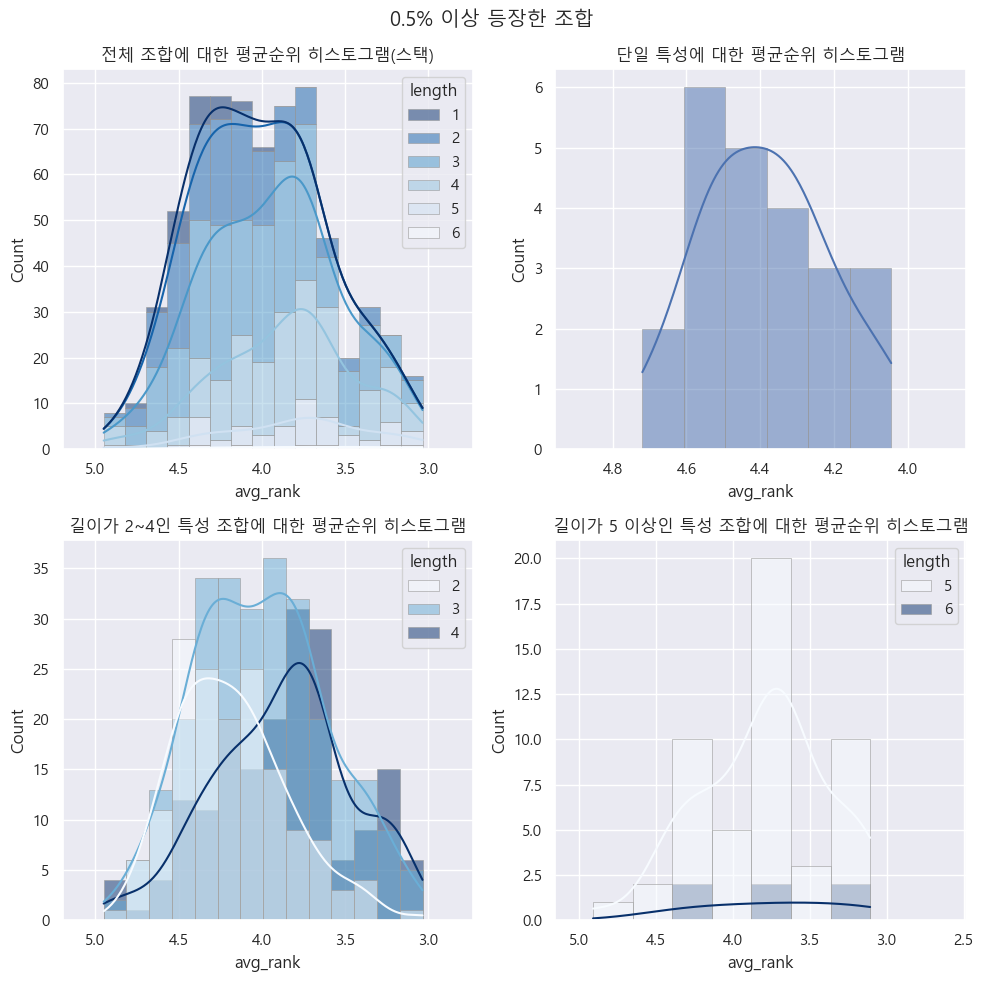

In [56]:
sns.set_theme(style='darkgrid', font=font_family, color_codes='deep')

fig = plt.figure(figsize=(10,10))
fig.suptitle(f"{criteria*100}% 이상 등장한 조합")
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)
ax3 = fig.add_subplot(2,2,3)
ax4 = fig.add_subplot(2,2,4)

# 그래프 1
data = limited_trait_comb_stat

ax = sns.histplot(
    data,
    x="avg_rank",
    hue="length",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax1
)

ax.set_title("전체 조합에 대한 평균순위 히스토그램(스택)")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.9)

# 그래프 2
data = limited_trait_comb_stat.loc[(limited_trait_comb_stat['length']<=1)]

ax = sns.histplot(
    data,
    x="avg_rank",
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax2
)

ax.set_title("단일 특성에 대한 평균순위 히스토그램")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.95)

# 그래프 3
data = limited_trait_comb_stat.loc[(limited_trait_comb_stat['length']<=4) & (limited_trait_comb_stat['length']>1)]

ax = sns.histplot(
    data,
    x="avg_rank",
    hue="length",
    # multiple="stack",
    palette=sns.color_palette("Blues", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax3
)

ax.set_title("길이가 2~4인 특성 조합에 대한 평균순위 히스토그램")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.9)

# 그래프 4
data = limited_trait_comb_stat.loc[(limited_trait_comb_stat['length']>4)]

sns.set_theme(style='darkgrid', font=font_family, color_codes='deep')

ax = sns.histplot(
    data,
    x="avg_rank",
    hue="length",
    # multiple="stack",
    palette=sns.color_palette("Blues", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    kde=True,
    ax=ax4
)

ax.set_title("길이가 5 이상인 특성 조합에 대한 평균순위 히스토그램")
ax.set_xlim(data["avg_rank"].max() * 1.05, data["avg_rank"].min() * 0.8)

plt.tight_layout()
plt.show()

#### 단일 특성의 사용 빈도, 사용 비율, 평균 순위 히트맵

In [57]:
single_trait_stat = per1_trait_comb_stat[per1_trait_comb_stat['length']==1]
single_trait_stat = single_trait_stat.loc[:, ['combination', 'avg_rank', 'frequency', 'percentage']]
single_trait_stat = single_trait_stat.set_index('combination')
single_trait_stat.sort_values(by='avg_rank', inplace=True)
single_trait_avg_rank = single_trait_stat.loc[:,['avg_rank']]

dropped_single_trait_stat = single_trait_stat.drop('avg_rank', inplace=False, axis=1)
dropped_single_trait_stat = dropped_single_trait_stat.sort_values(by='frequency', ascending=False)

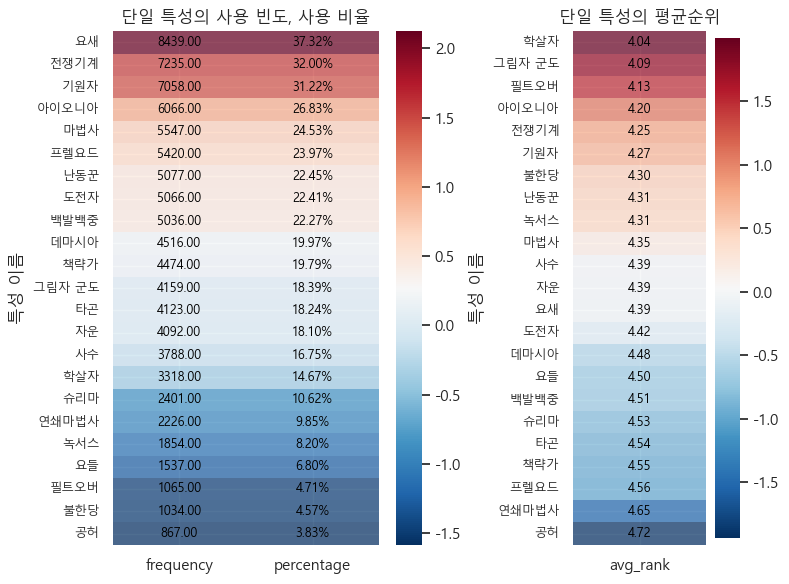

In [60]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(dropped_single_trait_stat)
scaled_df = pd.DataFrame(scaled_data, columns=dropped_single_trait_stat.columns, index=dropped_single_trait_stat.index)

fig = plt.figure(figsize=(8, 6))

# GridSpec 설정
gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1])  # 1행 2열, 첫 번째 그래프 폭을 두 번째 그래프 폭의 2배로 지정

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

heatmap = sns.heatmap(scaled_df, annot=False, cmap="RdBu_r", fmt=".2f", ax=ax1)

# Adjust the alpha value for the colormap
heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)

# 주석 추가로 원래의 값을 나타냅니다.
for i in range(len(dropped_single_trait_stat.index)):
    for j in range(len(dropped_single_trait_stat.columns)):
        if j==1:
            ax1.text(j + 0.5, i + 0.5, f"{dropped_single_trait_stat.iloc[i, j]*100:.2f}%", ha="center", va="center", color="Black", fontsize=9)
            continue
        ax1.text(j + 0.5, i + 0.5, f"{dropped_single_trait_stat.iloc[i, j]:.2f}", ha="center", va="center", color="Black", fontsize=9)
            
ax1.set_title("단일 특성의 사용 빈도, 사용 비율")
ax1.set_ylabel("특성 이름")
ax1.yaxis.set_tick_params(labelsize=9)

# graph2
scaled_data = scaler.fit_transform(single_trait_avg_rank)
scaled_df = pd.DataFrame(scaled_data, columns=single_trait_avg_rank.columns, index=single_trait_avg_rank.index)

# 순위 데이터의 기준과 다른 데이터의 기준을 맞추기
scaled_df['avg_rank'] =scaled_df['avg_rank'].apply(lambda x: -x)

heatmap = sns.heatmap(scaled_df, annot=False, cmap="RdBu_r", fmt=".2f", ax=ax2)

# Adjust the alpha value for the colormap
heatmap.get_children()[0].set_alpha(0.7)  # Adjust the alpha value (0.0 to 1.0)

# 주석 추가로 원래의 값을 나타냅니다.
for i in range(len(single_trait_avg_rank.index)):
    for j in range(len(single_trait_avg_rank.columns)):
        ax2.text(j + 0.5, i + 0.5, f"{single_trait_avg_rank.iloc[i, j]:.2f}", ha="center", va="center", color="Black", fontsize=9)
            
ax2.set_title("단일 특성의 평균순위")
ax2.set_ylabel("특성 이름")
ax2.yaxis.set_tick_params(labelsize=9)

plt.tight_layout()
# plt.savefig("graph.png")  # 파일 경로와 이름 지정
plt.show()

#### 길이 2 이상인 유닛 조합의 사용 비율, 평균 순위 히트맵(Top10, Bottom10)

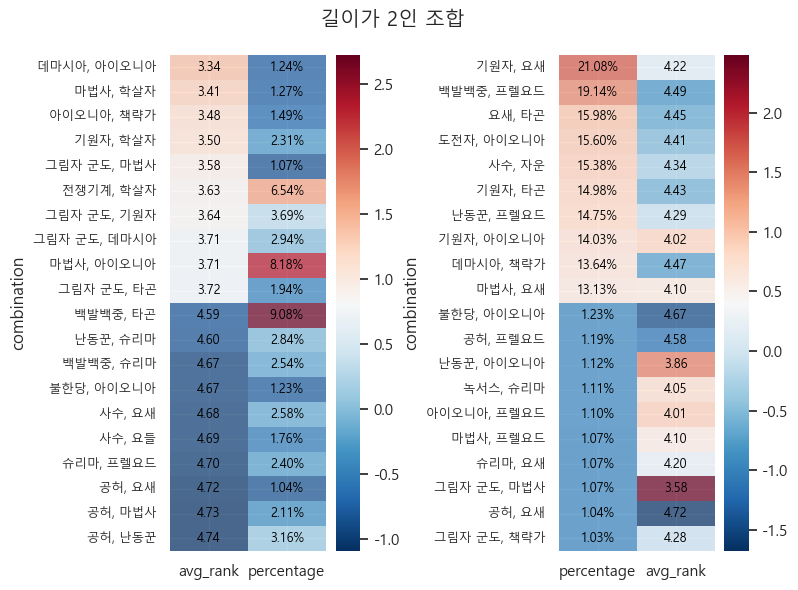

In [59]:
sns.set_theme(style='darkgrid', font=font_family)
trait_stat_len2 = per1_trait_comb_stat[per1_trait_comb_stat['length']==2]

trait_stat_len2_avgrank = get_sorted_column_df(trait_stat_len2, 'combination', ['avg_rank', 'percentage'])
trait_stat_len2_percent = get_sorted_column_df(trait_stat_len2, 'combination', ['percentage', 'avg_rank'], False)
plot_avgrank_percentage_heatmap_col2(trait_stat_len2_avgrank, trait_stat_len2_percent, fig_size=(8,6), title="길이가 2인 조합")